# Machine Learning - Classification

In the last session we looked into how we can fit different types of ML models to predict a numeric value - the spending amount of the customer. But what if we are trying to predict a non-numeric value? Say now we have data on micro loans taken by a diverse group of people, for various purposes, and also data how many of these people have given back the loan, how many have not. Given this data, we would want to build a model which will be able to predict whether, given the data, a customer is most likely to default or not.

This type of ML models are known as Classification models. We call them classifications because they try to classify data into different groups. There are many uses of classification models, predicting if someone is going to default, predicting that given the data, whether the celestial object is a star, predicting whether a customer will churn, predicting whether an email is spam and predicting for a slef driven car whether the object in front is a human being and should it stop or not!

The process of fitting a Classification model is absolutely identical to that of the Regression ML that we covered in the last session. We do the following:
1. First we preprocess the data to make it ready for our machine learning models
2. Next, we separate the data into training and test sets
3. Next, we define the model object, fit the model to the data
4. Then we check the accuracy of the model
5. Finally, we compare the model with other models accuracy

These steps are very similar to the Regression ML approach, and the only difference is how we measure model accuracy, as we will not be comparing numbers anymore. But lets cross that bridge when we reach there. For now, even before we do any ML, we will first load the necessary libraries and then load the data, and explore the data a little bit. For this session, we will use a different dataset, a dataset on loans, as that is ideal for classification, and will also help us to go through the things that we have learned before

In [1]:
# We start with importing pandas and numpy (numpy for numeric calculations that we might need)
import pandas as pd
import numpy as np

# Loading the data
loandata = pd.read_csv("/Users/muhammadsaqifulalam/Dropbox/My Mac (FVFD1URVP3XY)/Desktop/credit_risk_dataset.csv")

# Taking a peek at the data
loandata.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


## Exploring and cleaning the dataset

From our previous sessions, there is a tool we can quickly use to summarise the dataset - Pandas Profiling. We will start with installing Pandas profiling and then run the summary report

In [2]:
# Installing Pandas Profiling
import sys

!{sys.executable} -m pip install pandas-profiling

# Loading the Pandas Profiling
from pandas_profiling import ProfileReport

# Creating the Report
profile = ProfileReport(loandata)

In [3]:
# Printing the Report
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

One of the things to note is that both the variables annual income and age, there are very extreme values. For example for Income there is a value of 6 million, and then for age there is a value of 144. Seems like both are outliers. So lets check each of these variables independently and if they are outliers, then lets remove these outlier value points. For this we will take a look at boxplots, and for bolxplots, we will set up our jupyter notebook for the libraries

In [4]:
# Converting pandas to handle matplotlib and seaborn
pd.plotting.register_matplotlib_converters()

# Importing matplotlib
import matplotlib.pyplot as plt

# Setting up plotting in the Jupyter Notebook
%matplotlib inline

# Importing seaborn
import seaborn as sns

Focusing on Income variable first. Lets look at the boxplot for Income to identify the outliers

<AxesSubplot:ylabel='person_income'>

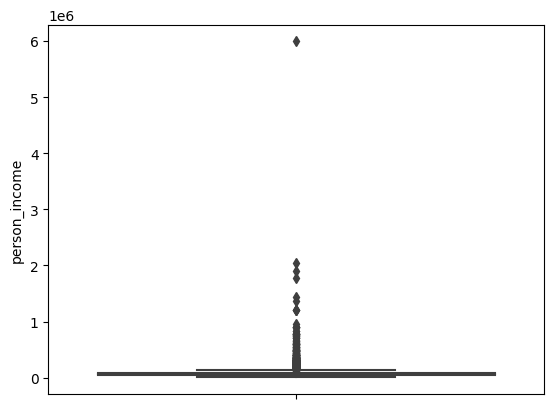

In [5]:
# Boxplot
sns.boxplot(y = loandata["person_income"])

This clearly shows that the dataset on annual income have some extreme outliers, incomes crossing those of 1000000. So let us keep only the data that has annual income lower than 1000000, to not make our model as accurate as possible

<AxesSubplot:ylabel='person_income'>

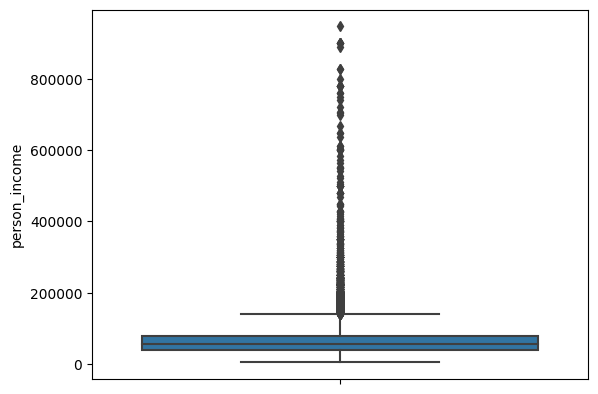

In [6]:
# Keeping datapoints only within income less than 1000000
loandata = loandata[loandata["person_income"] < 1000000]

# Getting an idea of the new annual income distribution
sns.boxplot(y = loandata["person_income"])

We still get a heavily skewed to the higher values dataset, but at least in cases like this, the outlier values will not completely dominate or affect the model. Now we can focus on the age variable

<AxesSubplot:ylabel='person_age'>

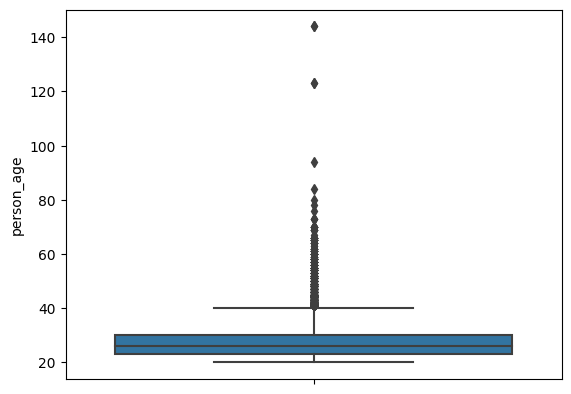

In [7]:
# Boxplot of Age
sns.boxplot(y = loandata["person_age"])

The case of age is not as bad as that of Income, where it was heavily skewed. But yes, in order to keep our model more accurate towards ages it is more likely to receive, we can cap this dataset at 80 age

<AxesSubplot:ylabel='person_age'>

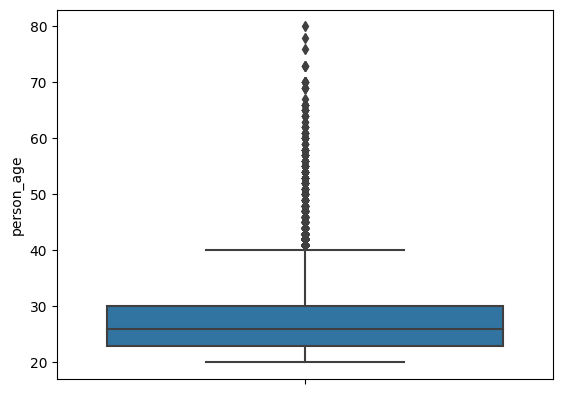

In [8]:
# Keeping only the observations with age less than or equal to 80
loandata = loandata[loandata["person_age"] <= 80]

# Checking the new boxplot
sns.boxplot(y = loandata["person_age"])

Another variable which looks like having extreme outliers is the employment length. Lets check the boxplot to start with

<AxesSubplot:ylabel='person_emp_length'>

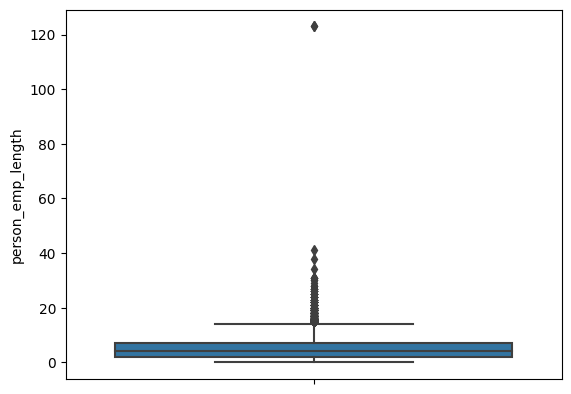

In [9]:
# Boxplot of employment length
sns.boxplot(y = loandata["person_emp_length"])

It seems very clear that the input of 123 was a wrong entry. The normal entries ended around employment length of 60 months. Let clean that point out and visualize the data

<AxesSubplot:ylabel='person_emp_length'>

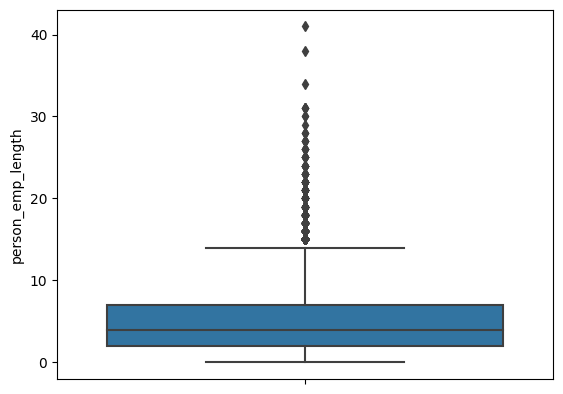

In [10]:
# Cleaning out the outlier for employment length
loandata = loandata[loandata["person_emp_length"] <= 60]

# Boxplot of employment length
sns.boxplot(y = loandata["person_emp_length"])

Now lets look tackle missing data. The good thing about this dataset is that it has only 4% missing data in one variable, and 9% missing data in another variable. Since by just sheer number it seems like missing data will not affect the outcome of the model, we can remove the missing data to improve on model accuracy

In [11]:
# Removing nulls from the dataset
loandata = loandata.dropna()

Another important thing we noted from the pandas profile report of the dataset is that there are some duplicate rows. We would need to clean the data for the duplicates, otherwise our model will put extra importance to the duplicate rows and might reduce accuracy

In [12]:
# Dropping duplicates in Pandas
loandata = loandata.drop_duplicates(keep = False)

# Checking for duplicates
sum(loandata.duplicated())

0

One final issue left in hand is the variable loan status. Lets see the distribution of the good vs bad loans

/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='loan_status', ylabel='count'>

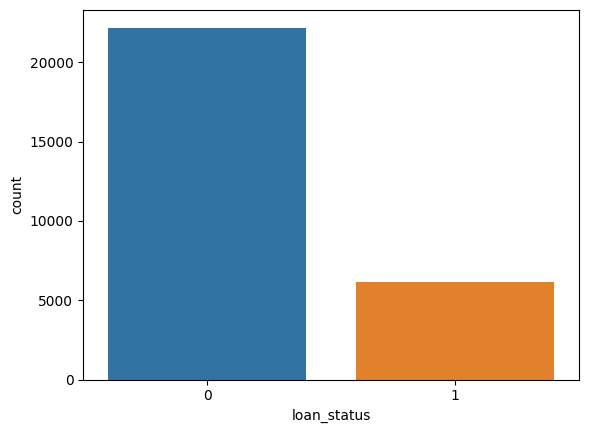

In [13]:
# Countplot of distribution of loan status
sns.countplot(loandata["loan_status"])

One thing to note here is that 0 means the loan was not defaulted and 1 means the loan was defaulted. In fact we quickly do a check of the % of defaults in the dataset

In [14]:
# To get a % of defaults in the dataset
loandata.loan_status.mean()

0.2176995520440196

This tells us that almost 20% of the are defaults. This is a tricky situation. This also tells us that 80% are not deaults. In situations like this, if we fit a model, and the model just declares everyone as non defaulter, the model will have 80% accuracy - pretty good right? But what about the real use of the model - completely misleading! Becase the model will completely fail in predicting any defaulter. This is a in modeling where we say that we have an unbalanced dataset. This means that the variable we want to predict is over-represented in our dataset, which will lead to models being fitted the wrong way. We would need to fix this issue

An easy way to balance an unbalanced dataset (called rebalancing a dataset) is to try to create a 1/3 and 2/3 ratio of the target variables at least. For our case, the ratio is 1/5 of the dataset (20%) have defaulted, and the 4/5 of the dataset, have not defaulted. We would need to make it 1/3 defaults and 2/3 non defaults. The way to do so will be:
1. We keep all the defaults - create a separate dataset where we filter all the rows that have the loan_status as 1
2. Count the number of defaults (1s) in the dataset, and then multiply the number by 2, that will be our size of non default dataset
3. From the larger non default dataset, sample the number of rows that we have obtained in 2. That will be our non default dataset sample we will use for model fitting
4. Then join the two datasets (1 and 4) to make our final balanced dataset, where 1/3 will be defaulters and 2/3 will be non defaulters

If these steps look complicated, dont you worry. We will do them one at a time now. We start with step 1, created a sub-dataset, with only defaulters

In [15]:
# Filtering the dataset for defaulters
loandata_def = loandata[loandata["loan_status"] == 1]

# Peeking at the data
loandata_def.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2
6,26,77100,RENT,8.0,EDUCATION,B,35000,12.42,1,0.45,N,3


Next comes the longer step. First we will need to sperate out the non defaulters, and then sample the 2 * the size of the default dataset from there

In [16]:
# Filtering out the dataset for non defaulters
loandata_nondef = loandata[loandata["loan_status"] == 0]

# Getting the number of rows and multiplying by 2 to get the sample size of the non def data final sample
non_def_sample_size = 2 * len(loandata_def)

# Getting the sample from the non def dataset which will be double the size of default dataset
loandata_nondef_sampled = loandata_nondef.sample(n = non_def_sample_size)

# A peek at the final non_def sample
loandata_nondef_sampled.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
27029,27,120000,MORTGAGE,4.0,VENTURE,A,8400,7.14,0,0.07,N,8
30959,40,71000,MORTGAGE,5.0,EDUCATION,E,7000,15.38,0,0.10,Y,12
28726,33,59450,MORTGAGE,1.0,PERSONAL,B,3000,10.38,0,0.05,N,5
24546,29,74004,MORTGAGE,2.0,DEBTCONSOLIDATION,B,10000,11.86,0,0.14,N,8
11418,24,74700,MORTGAGE,4.0,VENTURE,B,19750,11.12,0,0.26,N,3


Now we join the rows of the two dataset, and shuffle the data a bit, to create our final dataset which we will be ready to build our models with

In [17]:
# Joining the two datasets to form the final dataset
finaldata = pd.concat([loandata_def, loandata_nondef_sampled])

# Reshuffling the data, so that it does not look like all the defaults were the first entry followed by all the non
# defaults
finaldata = finaldata.sample(n = len(finaldata))

#Peeking at the data
finaldata.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
20540,34,77000,RENT,0.0,VENTURE,A,4800,7.14,0,0.06,N,7
2183,22,30288,MORTGAGE,2.0,EDUCATION,C,6000,12.73,0,0.20,N,2
15683,25,154000,MORTGAGE,1.0,EDUCATION,B,21600,10.37,0,0.14,N,3
5897,24,72000,RENT,8.0,EDUCATION,B,5500,9.91,0,0.08,N,3
19963,28,60000,RENT,10.0,HOMEIMPROVEMENT,C,10500,15.27,0,0.17,Y,6


Lets check the percentage of default now (should be 33%) and also the countplot to get an idea if we could have rebalanced successfully

In [18]:
# Portion of defaults in the final dataset
finaldata.loan_status.mean()

0.3333333333333333

/Users/muhammadsaqifulalam/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='loan_status', ylabel='count'>

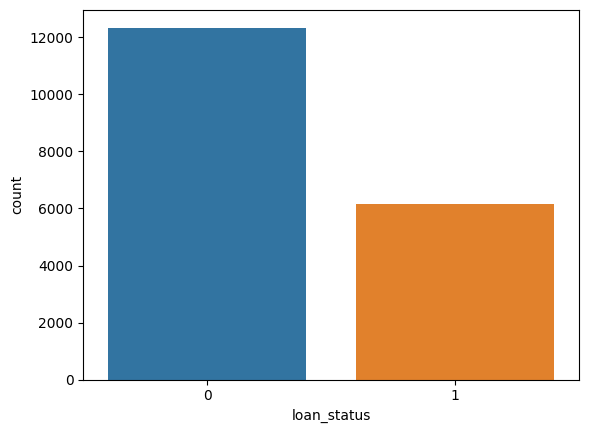

In [19]:
# Countplot
sns.countplot(finaldata["loan_status"])

Almost there! This whole exercise was an example of how we can look at the data and then set it up to fit models. The final step is to explore the new data's summary a bit, just to make sure that the insights we had before are not violated, and that the dataset is not diminated by missing values, duplicates or outliers

In [20]:
# Generating the summary profile again, on the final data
ProfileReport(finaldata)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

No duplicates, no missing values, no extremes! So our data cleaning job is done. Just just just one last thing - one new column was created that was recording the original datasets row number, and we dont need that, otherwise our model will take that as a relevant variable. Lets click that out

In [21]:
# Removing the df_index column
finaldata = finaldata.reset_index(drop = True)

# Peeking to check it if worked
finaldata.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,34,77000,RENT,0.0,VENTURE,A,4800,7.14,0,0.06,N,7
1,22,30288,MORTGAGE,2.0,EDUCATION,C,6000,12.73,0,0.20,N,2
2,25,154000,MORTGAGE,1.0,EDUCATION,B,21600,10.37,0,0.14,N,3
3,24,72000,RENT,8.0,EDUCATION,B,5500,9.91,0,0.08,N,3
4,28,60000,RENT,10.0,HOMEIMPROVEMENT,C,10500,15.27,0,0.17,Y,6


## Classification Model Using Binary Regression

One of the models that we use for classification is Binary Regression. It is a regression where instead of predicting a single continuous number, it predicts outputs either 0 or 1. Two of the common models for binary regression are probit and logit, and it would be beyond the scope of this notebook to explain them in detail here. You can still get an idea about them in the stat quest youtube channel shared below:

Logistic (Logit) Regression - https://www.youtube.com/watch?v=yIYKR4sgzI8&t=1s
(Probit is very similar to Logit)

The steps to use binary regression model is to start with preparing the data first. In data preparation, we will generate the dummy variables for categorical datasets and then also scale the dataset using min max scaler. Then we will load the model, fit the model, and check for the accuracy of the model

In [22]:
# Starting with generating the dummy variables
finaldata_dummy = pd.get_dummies(finaldata)

# Scaling the dataset using MinMax Scaler
# Loading the scaler
from sklearn.preprocessing import MinMaxScaler

# Creating the Scaler Object
scaler = MinMaxScaler()

# Scaling the data
scaled = scaler.fit_transform(finaldata_dummy)

# Converting the scaled array to a dataframe
scaled_finaldata = pd.DataFrame(scaled, columns = finaldata_dummy.columns)

# Taking a peek at the scaled data
scaled_finaldata.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
0,0.233333,0.081473,0.000000,0.124638,0.096629,0.0,0.076923,0.178571,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.033333,0.029339,0.052632,0.159420,0.410674,0.0,0.256410,0.000000,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.083333,0.167411,0.026316,0.611594,0.278090,0.0,0.179487,0.035714,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.066667,0.075893,0.210526,0.144928,0.252247,0.0,0.102564,0.035714,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.133333,0.062500,0.263158,0.289855,0.553371,0.0,0.217949,0.142857,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


Now that the data is being pre-processed, next we divide the data intro Train and Test sets as well as into X variables and Y variable (loan_status)

In [23]:
# Loading the train test split function from sklearn
from sklearn.model_selection import train_test_split

# Separating the X variables - predictors we will use to make the predictions
X = scaled_finaldata.drop("loan_status", axis = 1)

# And the Y variable - our targetr variable
Y = scaled_finaldata.loan_status

# Then creating our train and test datasets in one go
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3)

# A peek at X Train
X_train.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,person_home_ownership_OTHER,person_home_ownership_OWN,...,loan_intent_VENTURE,loan_grade_A,loan_grade_B,loan_grade_C,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,cb_person_default_on_file_N,cb_person_default_on_file_Y
15881,0.166667,0.062500,0.000000,0.159420,0.197753,0.128205,0.214286,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
12610,0.233333,0.289067,0.052632,0.710145,0.612360,0.128205,0.250000,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
7979,0.200000,0.030134,0.105263,0.333333,0.000000,0.500000,0.142857,1.0,0.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
5021,0.116667,0.040179,0.000000,0.217391,0.574719,0.256410,0.142857,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
16202,0.133333,0.051184,0.052632,0.710145,0.432022,0.641026,0.178571,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


Now we are ready to fit our logit model to the train data. The steps are very similar to what we looked in the previous section - load the model, create a model object, fit the model, and then check for accuracy

In [24]:
# Importing Logitstic Regression from the Sklearn library
from sklearn.linear_model import LogisticRegression

# Creating the model object
logit = LogisticRegression(max_iter = 1000)

# Fitting the model to the data
logit.fit(X_train, Y_train)

# Checking the output of the prediction
print(logit.predict(X_train.head()))

# For binary regression models, we can also check the probability of something becoming 0 or 1
logit.predict_proba(X_train.head())

[0. 0. 0. 1. 1.]


array([[0.89422005, 0.10577995],
       [0.72427331, 0.27572669],
       [0.69079924, 0.30920076],
       [0.21490791, 0.78509209],
       [0.11097865, 0.88902135]])

Lets spend some time to understand the outputs. The first output tells us that the first person in X_train is predicted to be a defaulter, the second person is also predicted as a defaulter, the third non defaulter, the fourth non defaulter and the fifth defaulter. On the other hand the probabilities how us what is the probalibity of a person to be a defaulter. The first column of the first row tells us that the probability of the first person to be a non-defaulter is 39.7%, and the second column of the first row tells us that the probability of the first person to be a defaulter is 60.2%. Normally, the algorithm divides at 50%, so if a probability is more than 50%, then that category is selected. For example, for the first row, the chance of default was greater than 50%, so the person is predicted as a defaulter.

Now lets measure the accuracy of our model. In this case we will create something called the confusion matrix and calculate some numbers to to get an idea of the accuracy. The best way to look at a confusion matrix is actually to create one. So lets start with creating the confusion matric for the logit model we created

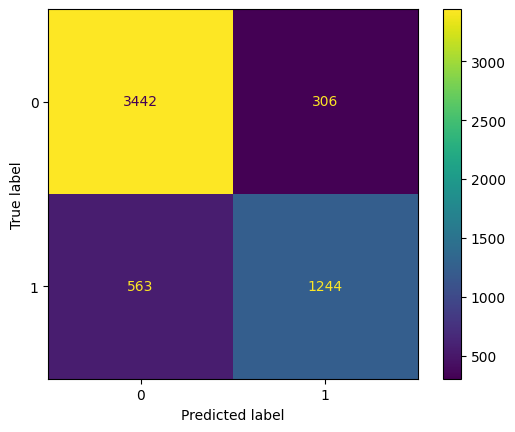

In [25]:
# First we start with importing the confusion matrix function and the display from sklearn
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Next we will create the confusion matrix
matrix = confusion_matrix(Y_test, logit.predict(X_test))

# Then we will plot the confusion matrix
ConfusionMatrixDisplay(matrix).plot()

Now lets spend some time trying to understand the confusion matrix. On the X axis we have our model predictions, and on the Y axis, we have our real values form the Test set. 0 means non defaulter, and 1 means defaulter. So we see that our model have been capable to correctly identify the 3386 non defaulters who were in the dataset. Similarly, the model have been able to correctly identify 1125 of the defaulters. But there were 631 real life defaulters whom our model has predicted as non defaulters (true label 1 predicted label 0), and there are 313 non defaulters who our model have predicted as defaulters (true label 0 and predicted label 1). This gives us a clear idea of how good our model is at predicting the right things, leaking the defaulters, and overkilling the non defaulters. We can also summarize them in to some calculations which we will generate now

In [26]:
# Loading a function - Classification Report from sklearn
from sklearn.metrics import classification_report

# Creating the classification report
print(classification_report(Y_test, logit.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89      3748
         1.0       0.80      0.69      0.74      1807

    accuracy                           0.84      5555
   macro avg       0.83      0.80      0.81      5555
weighted avg       0.84      0.84      0.84      5555



A good article to explain these numbers can be found here - https://www.jcchouinard.com/classification-report-in-scikit-learn/

But lets explain them here as well
1. Accuracy - 83%. This number tells us that the model is able accurately identify a defaulter as a defaulter and a non defaulter as a non defaulter in 83 out of 100 cases. This is the overall accuracy of the model
2. For the next two metrics, we will focus on the values for the row of "1.0". The first column is precision. This is basically the percetange of true defaults among all the defaults predicted. The closer to 1 the better. The score is 0.8. This means that out of 100 defaults predicted by the model, 80 is bound to default
3. The next column is recall. This tells us, out of all the real life defaults, how many could our model catch. This score is low for our model - only 66%. This means that those who will apply for loan, and is very highly likely to default, among them our model will be able to pick only 66 out of 100. The rest 34 will become bad loans

Among recall and precision, which ones should we focus on? Depends on the situation. Low precision will mean that we are overkilling a lot, whereas low recall will mean that we are missing out potential defaults. At this stage, the bank can give us an idea of what is the loss of not giving a loan versus the loss of not recoving one. Normally for credit or loan default, we would want the model's recall to be better, in which case, the binary regression model, with the accuracy of 84% is still not a good model! Lets explore another model!

## Tree Based Classification - Recursive Partitioning

Another common algorithm used to predict classes in machine learning is to use the recursive partitioning, a tree based method, similar to the regression tree you saw in the last session. A good primer to tree based modeling can be seen in this video - https://www.youtube.com/watch?v=_L39rN6gz7Y&t=2s

The steps are almost identical to that of the binary regression - load the package, craete the object, fit the model, and predict and evaluate. Lets first fit the model

In [27]:
# Importing the decision tree function
from sklearn.tree import DecisionTreeClassifier

# Creating the model object
tree_model = DecisionTreeClassifier()

# Fitting the model with the train dataset
tree_model.fit(X_train, Y_train)

# Checking some predictions to see how it looks like
tree_model.predict(X_train.head())

array([0., 1., 0., 1., 1.])

Similar to the binary regression, our next step will be to see how the confusion matrix looks like

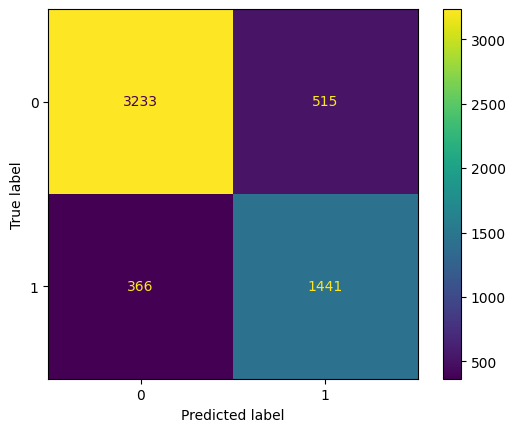

In [28]:
# Creating the confusion matrix
matrix = confusion_matrix(Y_test, tree_model.predict(X_test))

# Plotting the matrix
ConfusionMatrixDisplay(matrix).plot()

Seems like our tree based model has done a better job in predicting the real defaulters, and have also done a better job in not labeling true defaulters as non defaulters. But lets also check the metrics

In [29]:
# Printing the clasification report of the Tree based model
print(classification_report(Y_test, tree_model.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.90      0.86      0.88      3748
         1.0       0.74      0.80      0.77      1807

    accuracy                           0.84      5555
   macro avg       0.82      0.83      0.82      5555
weighted avg       0.85      0.84      0.84      5555



Accuracy has stayed the same, but here we can see that this model is more prone to overkill - declare safe lenders as defaulters. But on the other hand, this model has better recall score - better at detecting defaulters. So if the main goal of the project is to catch the defaulters, then the tree based model does a better job than the regression model.

Now that we have seen that the tree model overall is good at predicting the defaulters, lets try and understand which variables play a major role in the determining who is a default and who is a non-defaulter. We will attempt to do this using the Shapley values we introduced in the last session

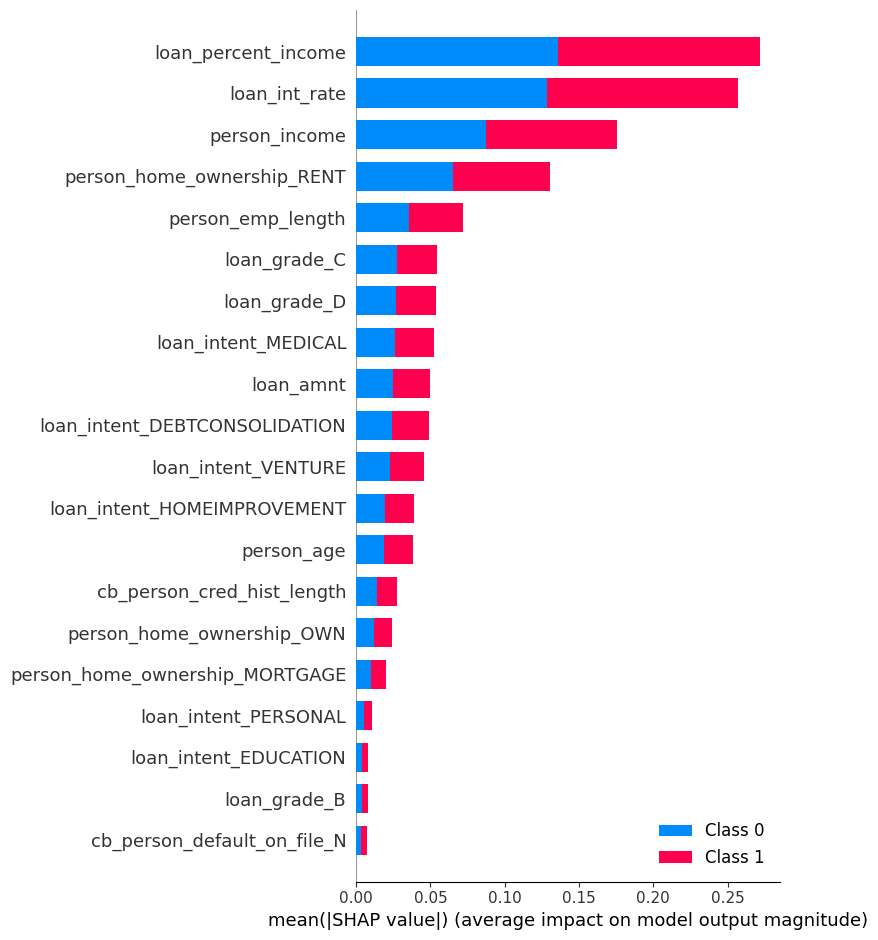

In [45]:
# First we install the shapley library
!{sys.executable} -m pip install shap

# Then we import the shapley library
import shap

# Next we generate our shapley values - which takes some time
shap_values = shap.TreeExplainer(tree_model).shap_values(X_train)

# Finally we plot the shapley importance of each of the variables
shap.summary_plot(shap_values, X_train)

This gives us a clear idea that 'Loan as a Percent of Income', 'Interest Rate Assigned to the loan' and 'Personal Income' are the top 3 variables that dominate in the model when determinig whether the person applying for the loan  is going to default or not.

This concludes our section on classification. Next up, we look into ensemble learning - why use one model when we can use a combination of models to get our job done!